In [1]:
#Importing necessary modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy import stats

In [2]:

data = pd.read_csv('Data_Cortex_Nuclear.csv')


In [3]:
#Checking the structure and data types in the dataset.

print("Shape of dataset:\n",data.shape)
print('\n')
print("Datatypes:\n",data.dtypes)
print('\n')


Shape of dataset:
 (1080, 82)


Datatypes:
 MouseID       object
DYRK1A_N     float64
ITSN1_N      float64
BDNF_N       float64
NR1_N        float64
              ...   
CaNA_N       float64
Genotype      object
Treatment     object
Behavior      object
class         object
Length: 82, dtype: object




In [4]:
#Checking the first and last 3 rows
print(data.head(3))
print('\n')
print(data.tail(3))

  MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
0   309_1  0.503644  0.747193  0.430175  2.816329  5.990152  0.218830   
1   309_2  0.514617  0.689064  0.411770  2.789514  5.685038  0.211636   
2   309_3  0.509183  0.730247  0.418309  2.687201  5.622059  0.209011   

    pBRAF_N  pCAMKII_N   pCREB_N  ...   pCFOS_N     SYP_N  H3AcK18_N  \
0  0.177565   2.373744  0.232224  ...  0.108336  0.427099   0.114783   
1  0.172817   2.292150  0.226972  ...  0.104315  0.441581   0.111974   
2  0.175722   2.283337  0.230247  ...  0.106219  0.435777   0.111883   

     EGR1_N  H3MeK4_N    CaNA_N  Genotype  Treatment  Behavior   class  
0  0.131790  0.128186  1.675652   Control  Memantine       C/S  c-CS-m  
1  0.135103  0.131119  1.743610   Control  Memantine       C/S  c-CS-m  
2  0.133362  0.127431  1.926427   Control  Memantine       C/S  c-CS-m  

[3 rows x 82 columns]


       MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
1077  J3295_13  0.22870

MouseID      0
DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64


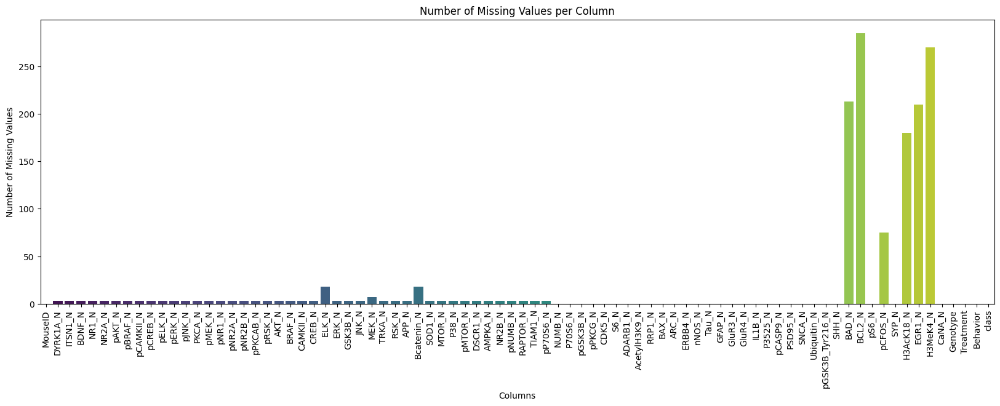

In [5]:
#Checking and handling missing data
#Since theres 82 columns viewing the missing data in numbers is  tedious so visualizing it
missing_data = data.isna().sum()
print(missing_data)

plt.figure(figsize=(20, 6))
sns.barplot(x=missing_data.index, y=missing_data.values,hue=missing_data.index, palette='viridis')
plt.title('Number of Missing Values per Column')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.xticks(rotation=90)
plt.show()

In [6]:
#using knn to fill missing data since ive never tried that
#A key  thing  to note is that all missing  values are protein expression level values  so to fill the missing data ill separate them for now
#first ensuring all protein expression  levels are numeric
print(data.columns)
protein_data = data.iloc[:, 1:78].astype(float)

#First Scaling the data  to ensure value  ranges are uniform then using knn impute to fill missing data
scaler = StandardScaler()
protein_data_scaled = scaler.fit_transform(protein_data)
imputer = KNNImputer(n_neighbors=5)
protein_data_imputed = imputer.fit_transform(protein_data_scaled)
protein_data_imputed = pd.DataFrame(protein_data_imputed, columns=protein_data.columns)
print(protein_data_imputed)
data.iloc[:, 1:78] = protein_data_imputed

Index(['MouseID', 'DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N',
       'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N',
       'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N',
       'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N',
       'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N',
       'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N',
       'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N',
       'pGSK3B_N', 'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N',
       'RRP1_N', 'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N',
       'GluR3_N', 'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N',
       'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N',
       'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N',
       'CaNA_N', 'Genotype', 'Treatment', 'Behavior', 'class'],
      dtype='object')
      DYRK

MouseID      0
DYRK1A_N     0
ITSN1_N      0
BDNF_N       0
NR1_N        0
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 82, dtype: int64


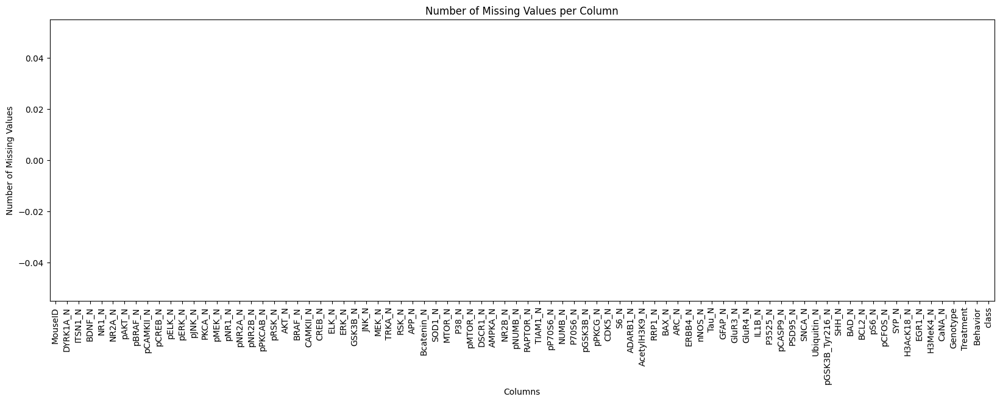

In [7]:
#Now checking missing data
missing_data = data.isna().sum()
print(missing_data)

plt.figure(figsize=(20, 6))
sns.barplot(x=missing_data.index, y=missing_data.values, hue=missing_data.index,palette='viridis')
plt.title('Number of Missing Values per Column')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.xticks(rotation=90)
plt.show()

In [8]:
#removing outliers

# Calculate Z-scores for the data
z_scores = stats.zscore(data.iloc[:, 1:78].astype(float))

# Convert Z-scores to a DataFrame
z_scores_df = pd.DataFrame(z_scores, columns=data.columns[1:78])
threshold = 4
outliers = (abs(z_scores_df) > threshold)

# Remove outliers
data_no_outliers_zscore = data[~outliers.any(axis=1)]
print(f"Removed {len(data) - len(data_no_outliers_zscore)} outliers using Z-score method.")
data = data_no_outliers_zscore

Removed 115 outliers using Z-score method.


In [9]:
print(data.head(1))
print("\n")
print(data.shape)


  MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N   pAKT_N  \
0   309_1  0.312276  0.517214  2.250537  1.495281  2.301162 -0.34454   

    pBRAF_N  pCAMKII_N   pCREB_N  ...  pCFOS_N     SYP_N  H3AcK18_N    EGR1_N  \
0 -0.158381  -0.898651  0.603275  ... -0.95247 -0.285744  -0.923474 -1.271459   

   H3MeK4_N    CaNA_N  Genotype  Treatment  Behavior   class  
0 -1.392474  1.065901   Control  Memantine       C/S  c-CS-m  

[1 rows x 82 columns]


(965, 82)


In [10]:
#Now checking the categories and their value counts
print("Genotypes: ",data['Genotype'].value_counts())
print("\n")
print("Treatment: ",data['Treatment'].value_counts())
print("\n")
print("Behavior: ",data['Behavior'].value_counts())
print("\n")
print("class: ",data['class'].value_counts())

Genotypes:  Genotype
Control    501
Ts65Dn     464
Name: count, dtype: int64


Treatment:  Treatment
Memantine    521
Saline       444
Name: count, dtype: int64


Behavior:  Behavior
S/C    495
C/S    470
Name: count, dtype: int64


class:  class
c-CS-m    146
c-SC-m    136
t-SC-s    132
t-CS-m    128
c-SC-s    116
t-SC-m    111
c-CS-s    103
t-CS-s     93
Name: count, dtype: int64


In [11]:
#Treatment, behavior,genotype will be dropped while training but class will be used as target variable so encoding it
le = LabelEncoder()
data['class_encoded'] = le.fit_transform(data['class'])
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print("\nLabel Mapping:")
print(label_mapping)


Label Mapping:
{'c-CS-m': 0, 'c-CS-s': 1, 'c-SC-m': 2, 'c-SC-s': 3, 't-CS-m': 4, 't-CS-s': 5, 't-SC-m': 6, 't-SC-s': 7}


<ipython-input-11-fbc460b866b8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['class_encoded'] = le.fit_transform(data['class'])


In [12]:
#Summary Statistics
summary_stats = data.iloc[:, 1:78].describe()
print(summary_stats)

         DYRK1A_N     ITSN1_N      BDNF_N       NR1_N      NR2A_N      pAKT_N  \
count  965.000000  965.000000  965.000000  965.000000  965.000000  965.000000   
mean    -0.067630   -0.062283   -0.016362   -0.006339    0.015480   -0.013808   
std      0.633313    0.691603    0.965357    0.973121    0.980673    0.908867   
min     -1.125328   -1.477969   -2.696685   -2.784069   -2.258464   -3.527972   
25%     -0.540218   -0.556742   -0.634747   -0.675409   -0.705413   -0.624628   
50%     -0.225986   -0.194207   -0.070506    0.009913   -0.061200   -0.047853   
75%      0.242188    0.290906    0.552732    0.661914    0.650088    0.526057   
max      2.272493    2.859760    2.989948    2.997575    3.513393    3.047112   

          pBRAF_N   pCAMKII_N     pCREB_N      pELK_N  ...       SHH_N  \
count  965.000000  965.000000  965.000000  965.000000  ...  965.000000   
mean    -0.017243    0.017017   -0.050222   -0.088925  ...   -0.025156   
std      0.912419    1.023712    0.963344    0.6

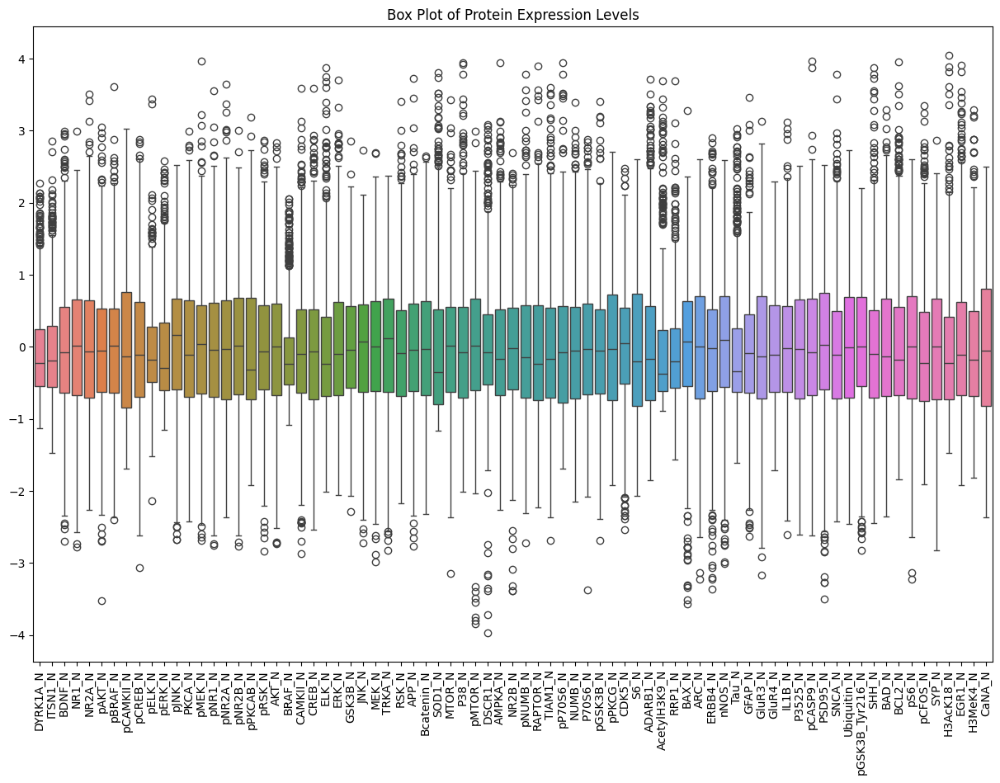

In [13]:

plt.figure(figsize=(15,10))
sns.boxplot(data=data.iloc[:, 1:78])
plt.title('Box Plot of Protein Expression Levels')
plt.xticks(rotation=90)
plt.show()

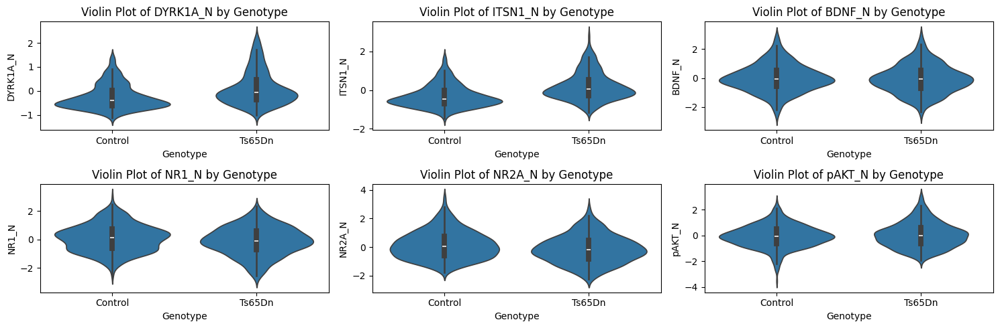

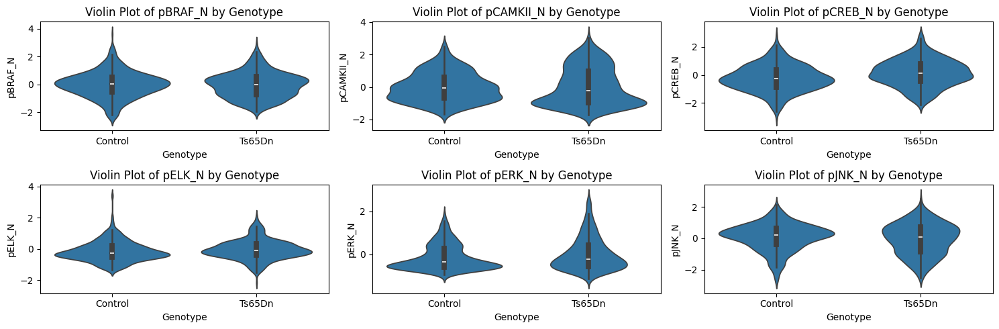

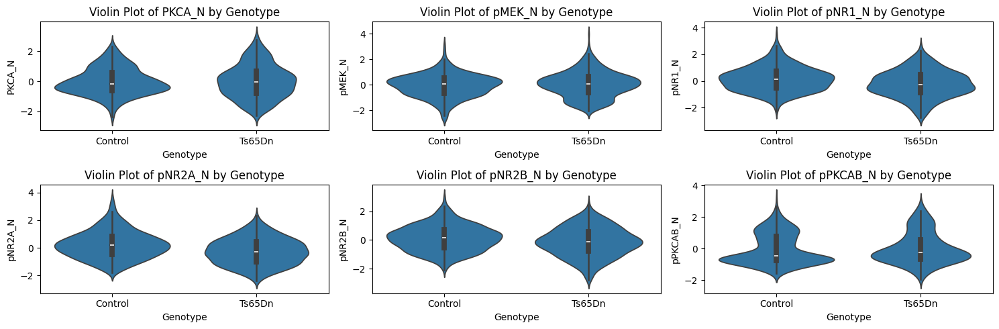

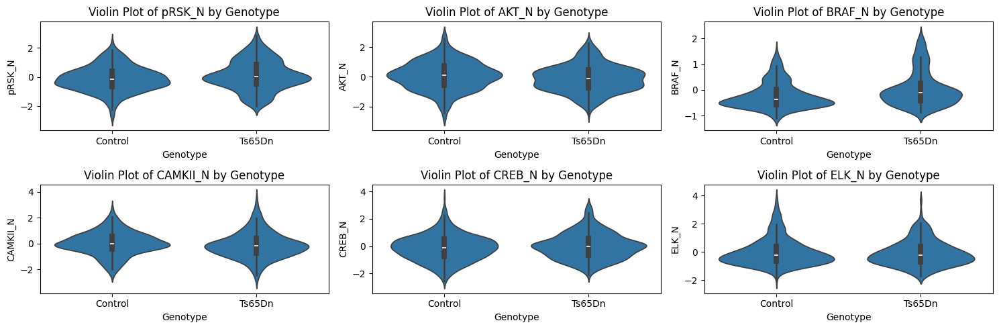

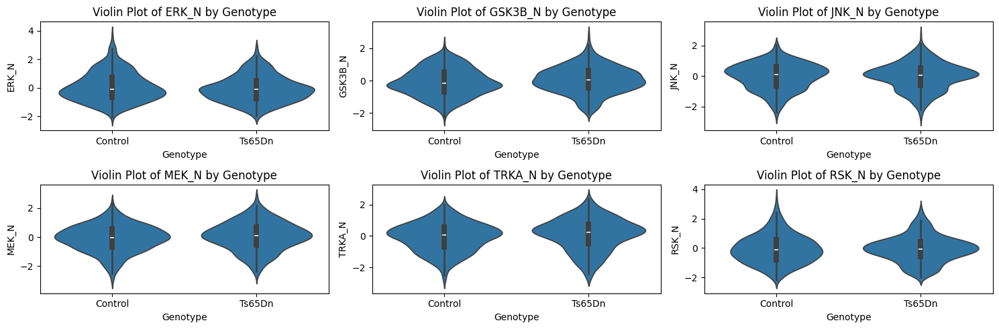

...

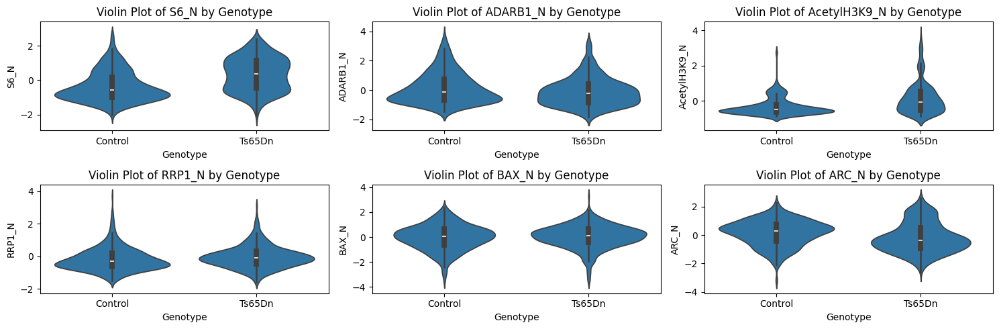

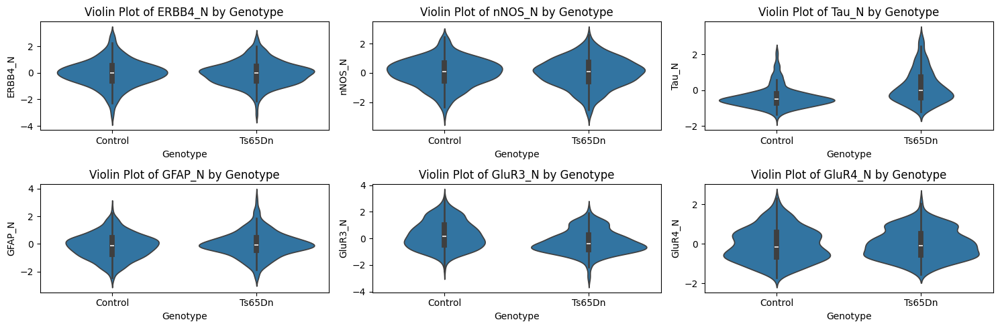

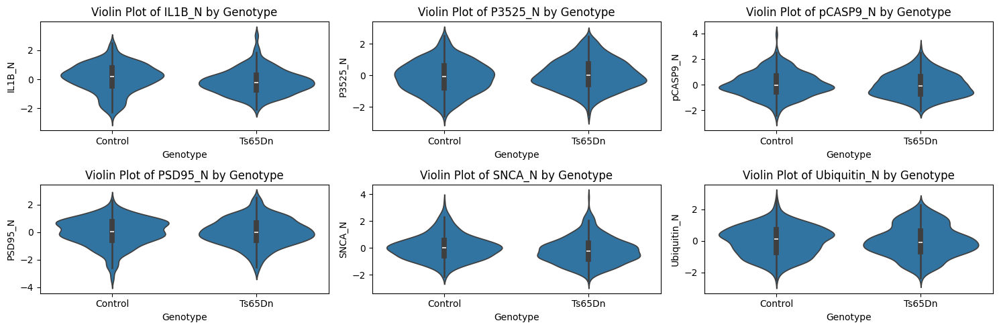

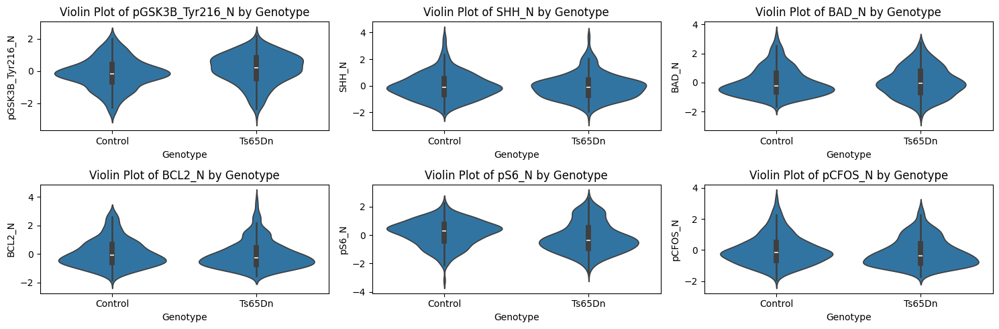

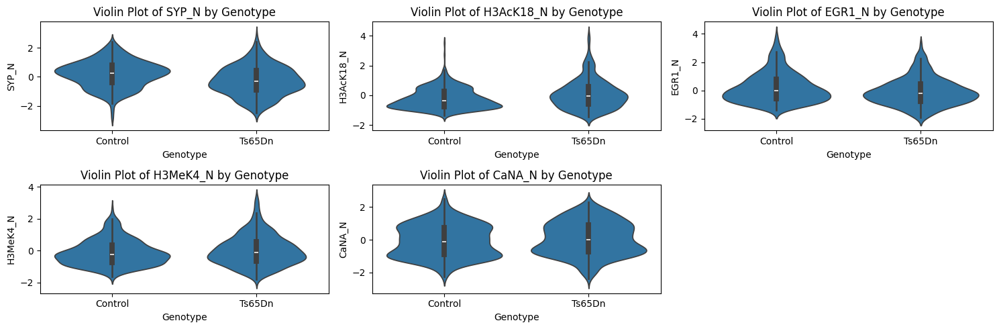

In [14]:
#Plotting protein expression levels according to genotype to find a relation
num_proteins = 77
proteins_per_figure = 6
protein_columns = list(data.iloc[:, 1:78].columns)

for start in range(0, num_proteins, proteins_per_figure):
    end = start + proteins_per_figure
    proteins = protein_columns[start:end]

    plt.figure(figsize=(15,5))

    for i, protein in enumerate(proteins, 1):
        plt.subplot(2, 3, i)
        sns.violinplot(x='Genotype', y=protein, data=data)
        plt.title(f'Violin Plot of {protein} by Genotype')


    plt.tight_layout()
    plt.show()

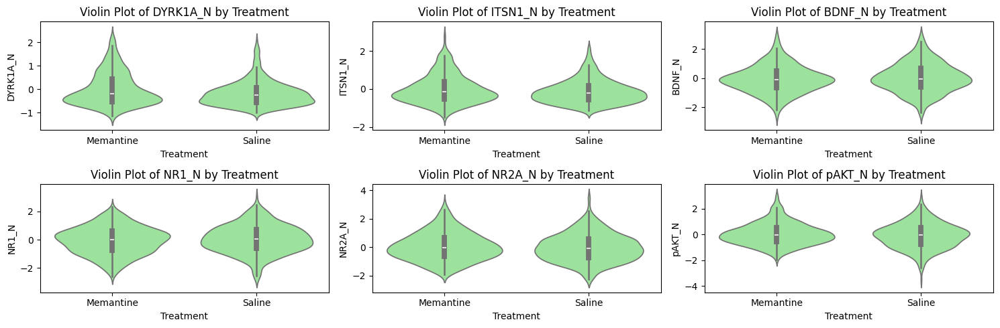

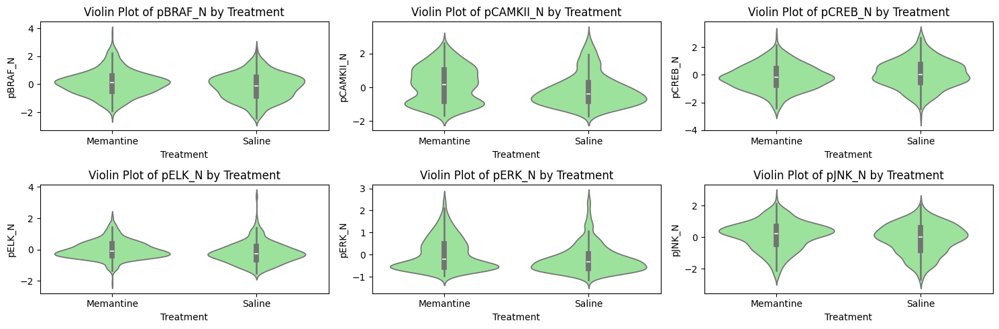

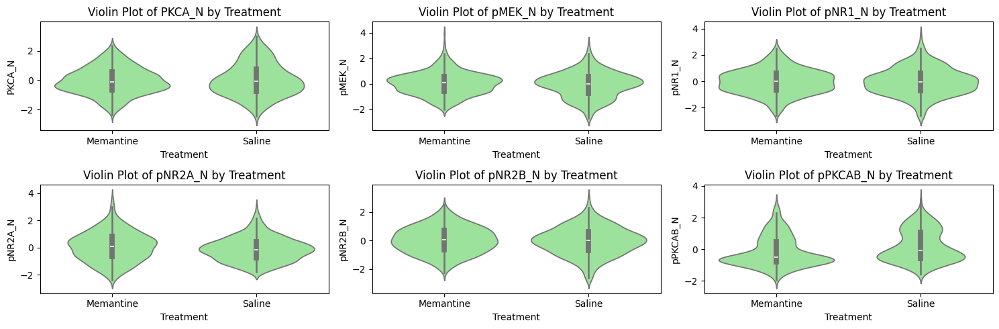

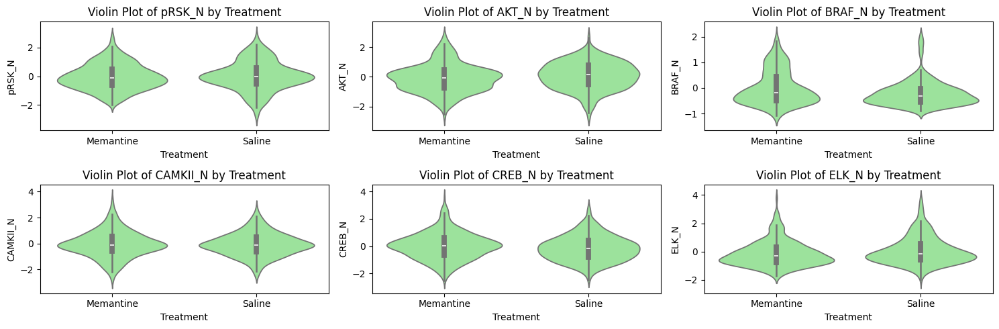

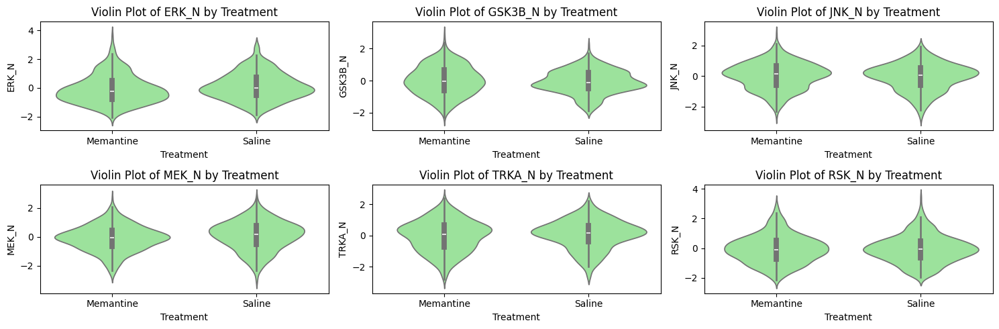

...

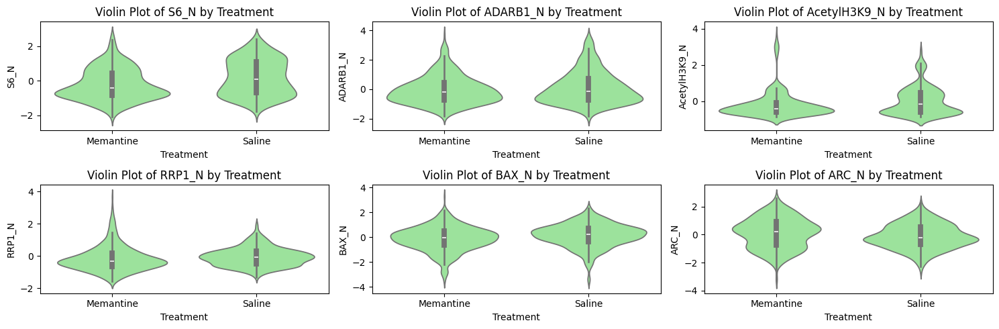

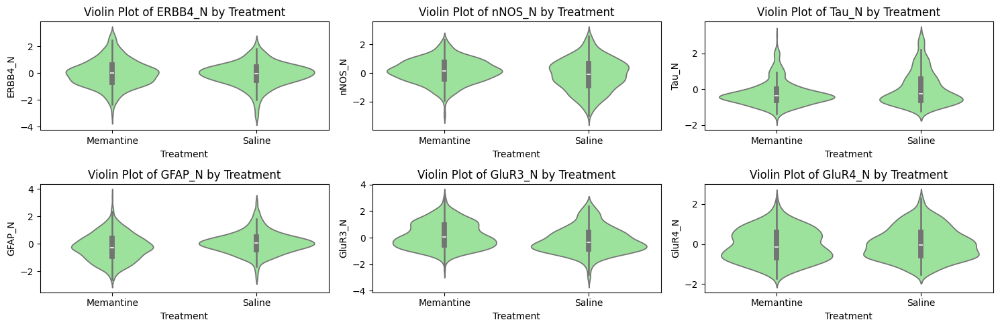

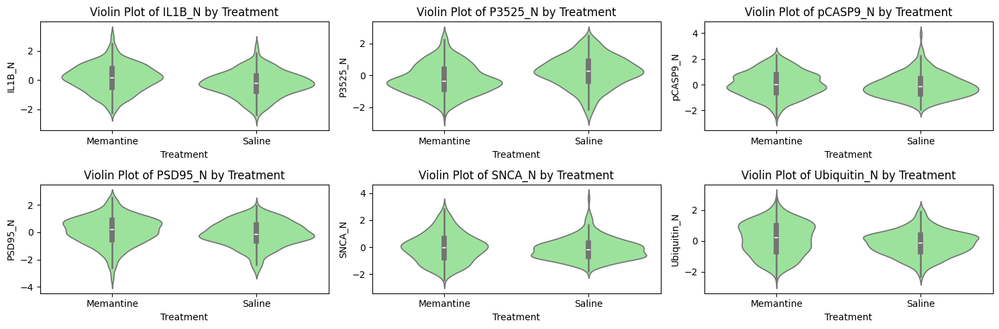

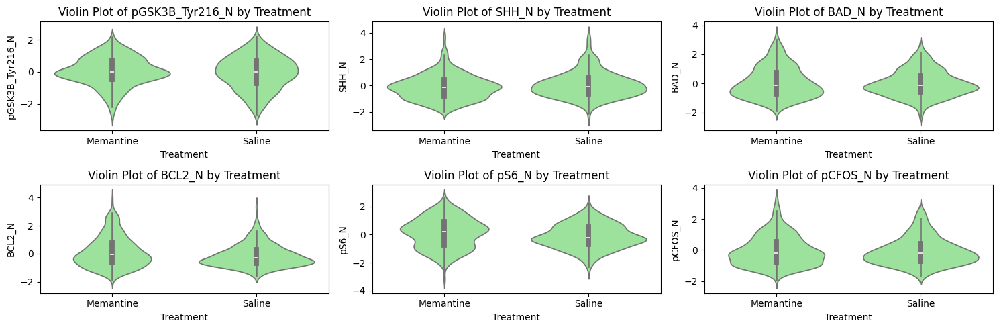

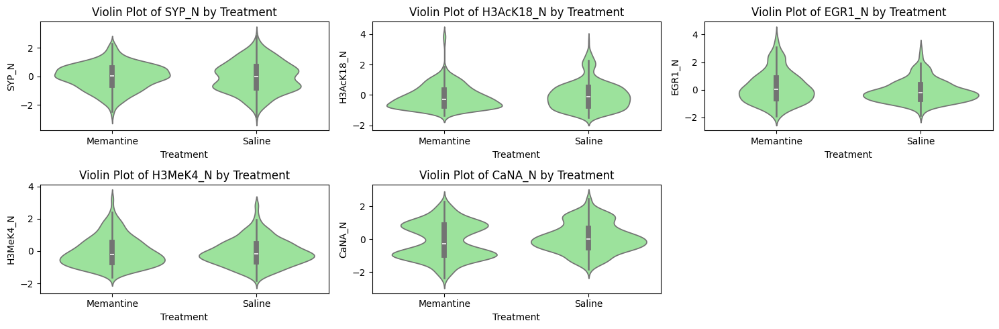

In [15]:
#Plotting protein expression levels according to treatment to find a relation
num_proteins = 77
proteins_per_figure = 6
protein_columns = list(data.iloc[:, 1:78].columns)

for start in range(0, num_proteins, proteins_per_figure):
    end = start + proteins_per_figure
    proteins = protein_columns[start:end]

    plt.figure(figsize=(15,5))

    for i, protein in enumerate(proteins, 1):
        plt.subplot(2, 3, i)
        sns.violinplot(x='Treatment', y=protein, data=data,color='lightgreen')
        plt.title(f'Violin Plot of {protein} by Treatment')


    plt.tight_layout()
    plt.show()

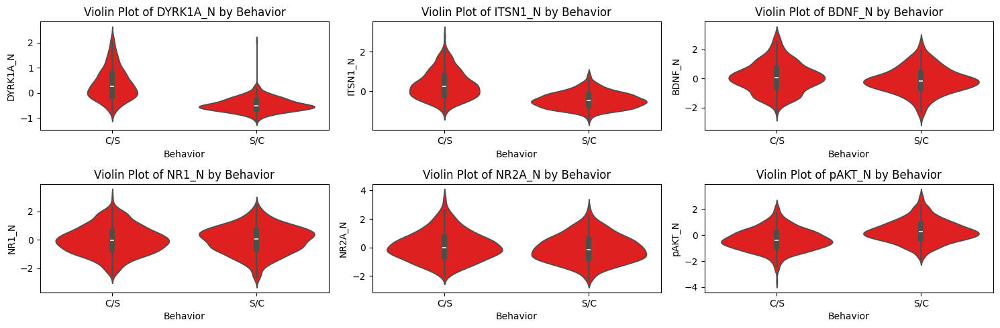

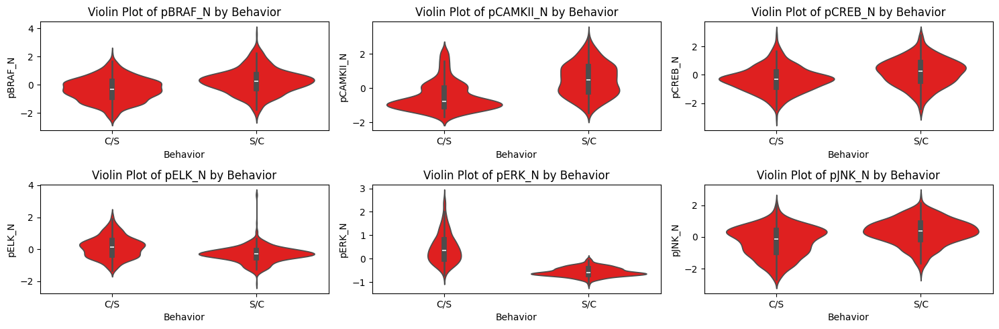

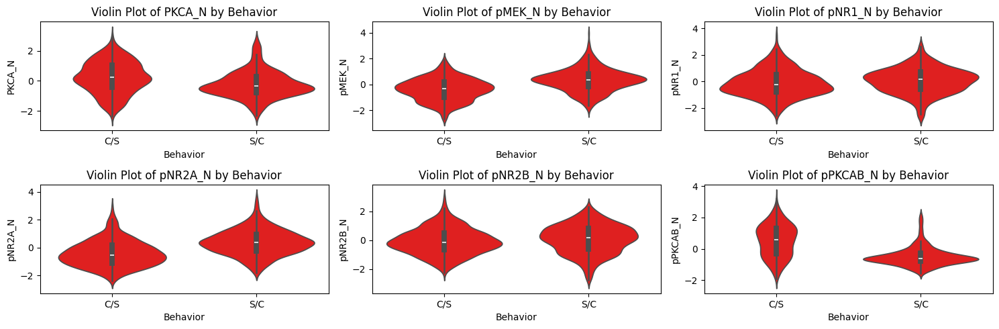

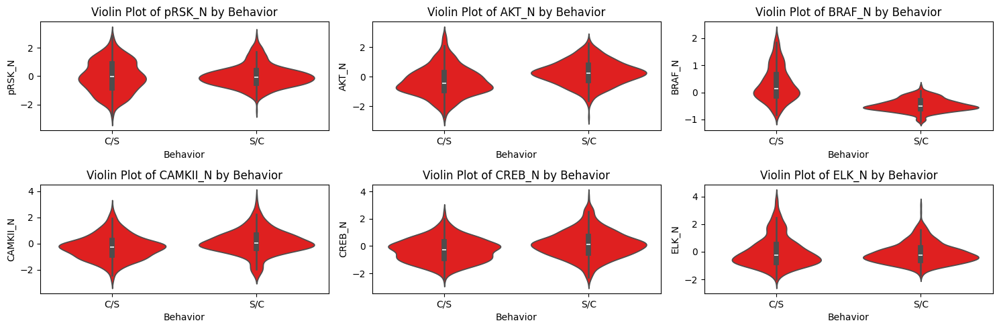

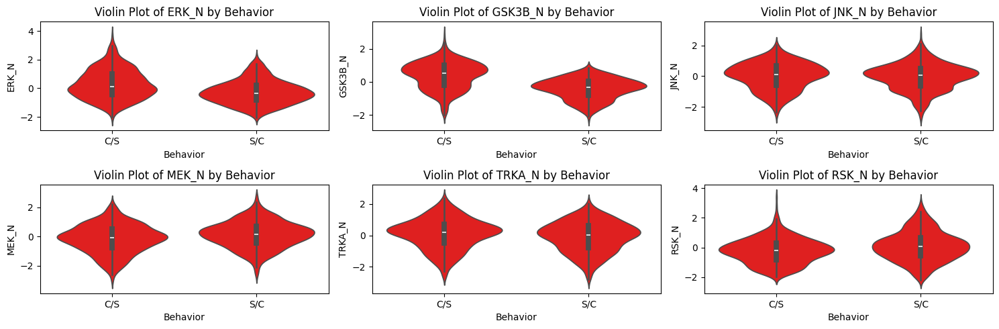

...

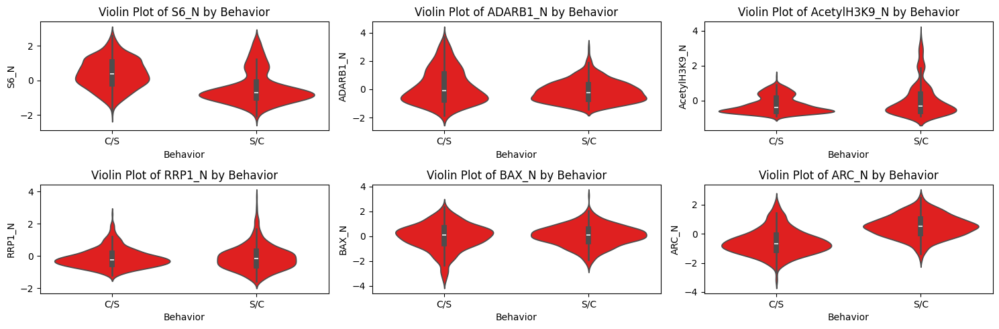

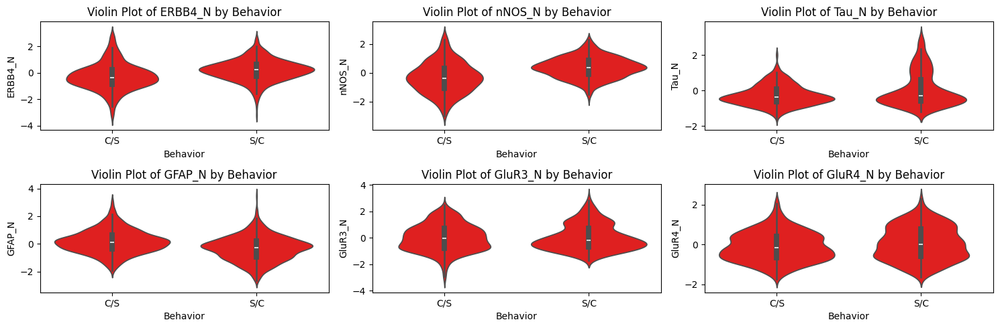

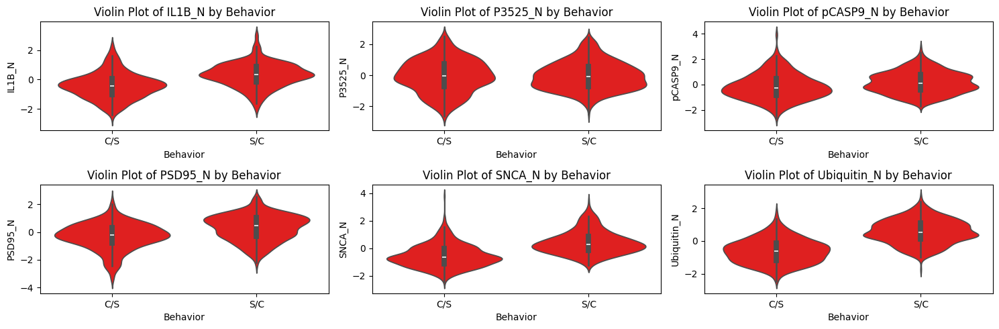

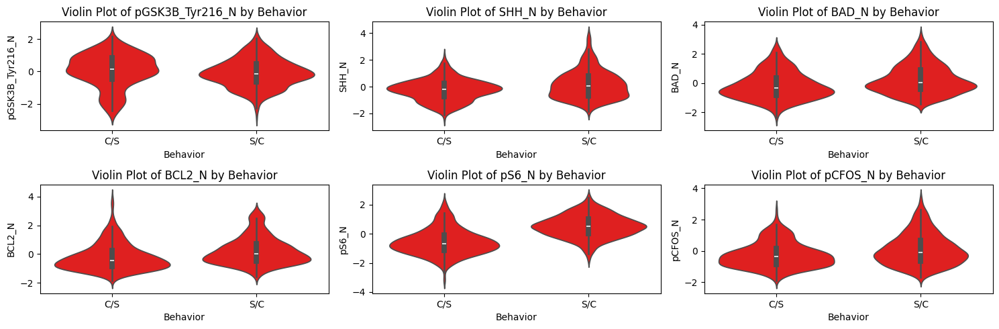

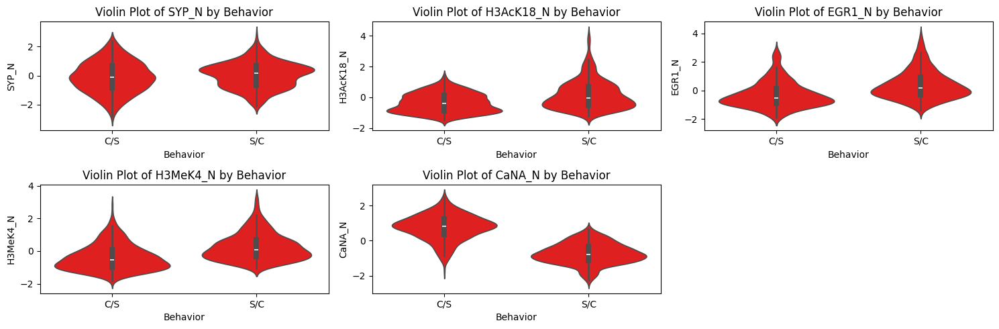

In [16]:
#Plotting protein expression levels according to Behavior to find a relation
num_proteins = 77
proteins_per_figure = 6
protein_columns = list(data.iloc[:, 1:78].columns)

for start in range(0, num_proteins, proteins_per_figure):
    end = start + proteins_per_figure
    proteins = protein_columns[start:end]

    plt.figure(figsize=(15,5))

    for i, protein in enumerate(proteins, 1):
        plt.subplot(2, 3, i)
        sns.violinplot(x='Behavior', y=protein, data=data,color='red')
        plt.title(f'Violin Plot of {protein} by Behavior')


    plt.tight_layout()
    plt.show()

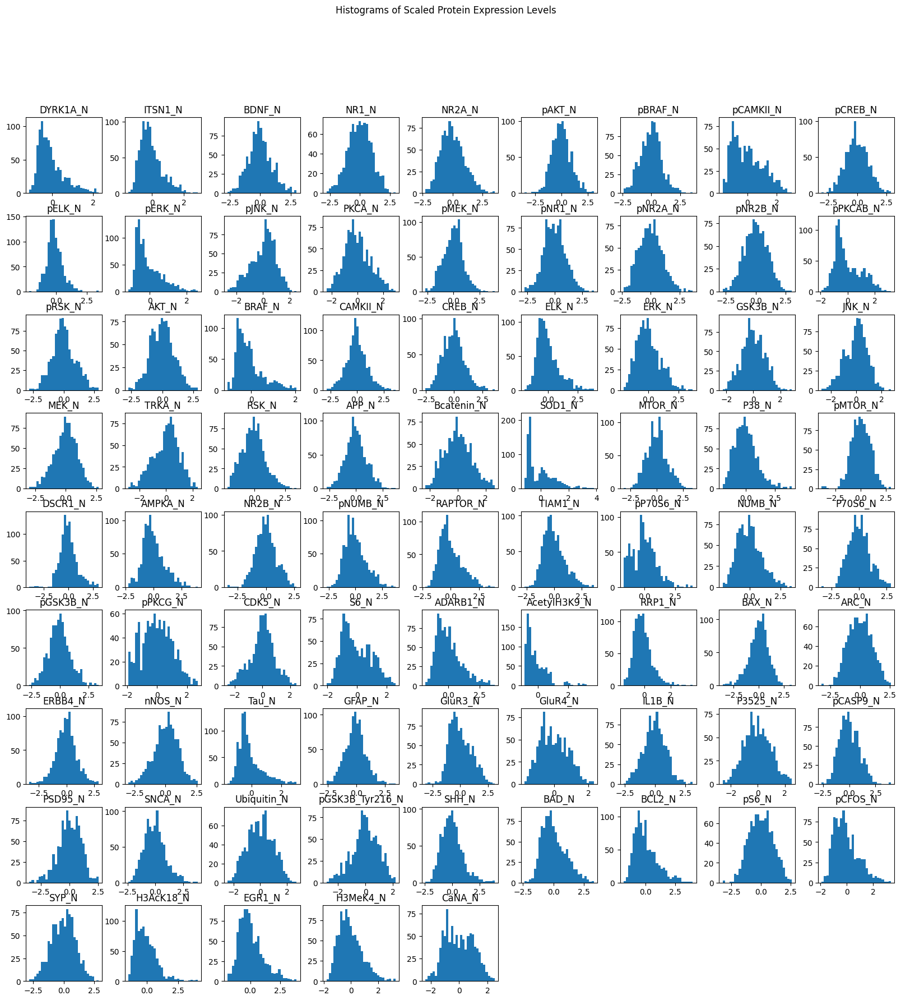

In [17]:
#plotting histograms showing expression levels vs frequency of all proteins
data.iloc[:, 1:78].hist(figsize=(20,20), bins=30, grid=False)
plt.suptitle('Histograms of Scaled Protein Expression Levels')
plt.show()

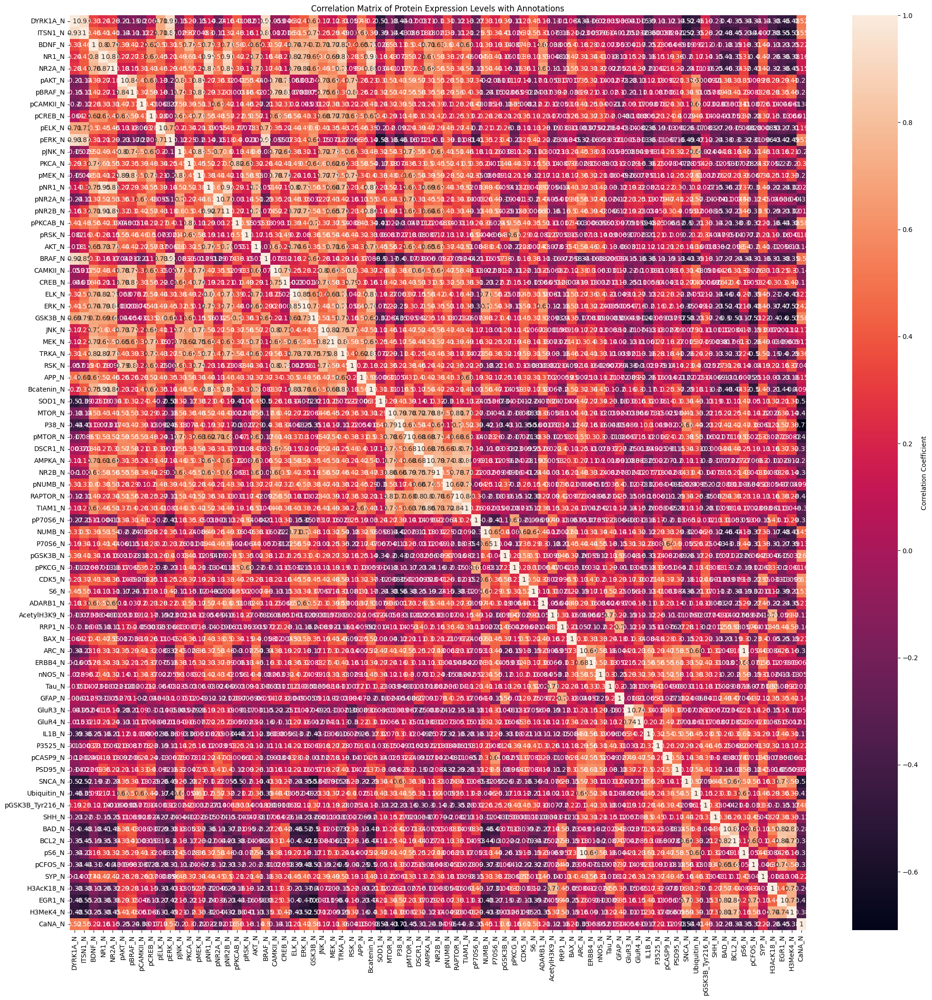

In [18]:
#Corelation Matrix
columns_of_interest = data.columns[1:78]
correlation_matrix = data[columns_of_interest].corr()

# Plot the correlation matrix heatmap with annotations
plt.figure(figsize=(25, 25))
sns.heatmap(correlation_matrix, annot=True, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Matrix of Protein Expression Levels with Annotations')
plt.show()



In [19]:
# Get the pairs of proteins with correlation greater than 0.7
high_correlation = correlation_matrix.abs() > 0.7
# Set the diagonal to False to ignore self-correlation
high_correlation = high_correlation.where(~np.eye(high_correlation.shape[0],dtype=bool))


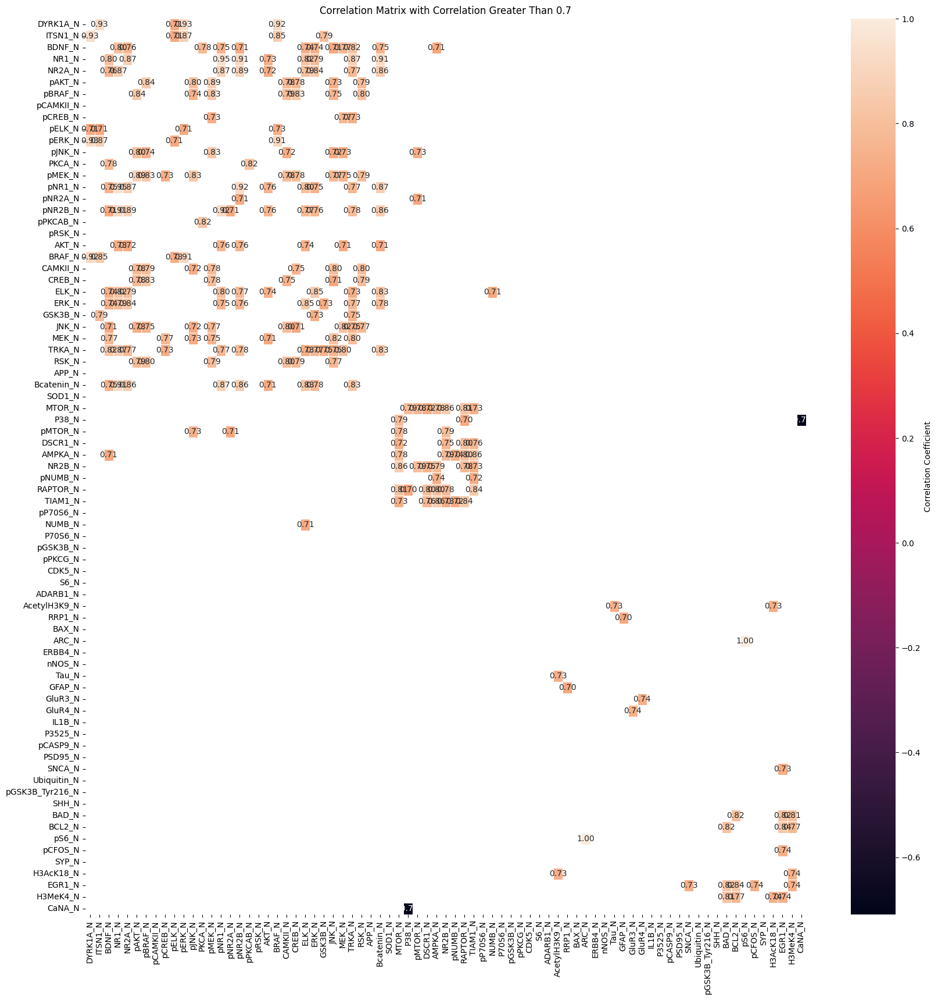

In [20]:
high_corr_matrix = correlation_matrix[high_correlation]

# Plot the high correlation matrix heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(high_corr_matrix,  annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Matrix with Correlation Greater Than 0.7')
plt.show()

In [21]:
#Listing 10 highest correlations and plotting them to use for feature selection
high_corr = high_corr_matrix.stack().sort_values(ascending=False)
print(high_corr)

pS6_N     ARC_N       1.000000
ARC_N     pS6_N       1.000000
pNR1_N    NR1_N       0.947517
NR1_N     pNR1_N      0.947517
DYRK1A_N  ITSN1_N     0.932416
                        ...   
P38_N     RAPTOR_N    0.703897
GFAP_N    RRP1_N      0.700538
RRP1_N    GFAP_N      0.700538
P38_N     CaNA_N     -0.709498
CaNA_N    P38_N      -0.709498
Length: 268, dtype: float64


In [22]:
#Removing duplicates
unique_pairs = set()
for (protein1, protein2), value in high_corr.items():
    if (protein2, protein1) not in unique_pairs:
        unique_pairs.add((protein1, protein2))

unique_pairs_with_values = pd.DataFrame([(pair[0], pair[1], correlation_matrix.loc[pair[0], pair[1]]) for pair in unique_pairs],
                                        columns=['Protein A', 'Protein B', 'Correlation'])

# Sort the DataFrame by correlation values in descending order
unique_pairs_with_values = unique_pairs_with_values.sort_values(by='Correlation', ascending=False)

# Print the unique high-correlation pairs with their correlation values
top_10_pairs = unique_pairs_with_values.head(10)
print(top_10_pairs)

      Protein A Protein B  Correlation
67        pS6_N     ARC_N     1.000000
15       pNR1_N     NR1_N     0.947517
22     DYRK1A_N   ITSN1_N     0.932416
69       pERK_N  DYRK1A_N     0.932089
116      pNR1_N   pNR2B_N     0.923963
126      BRAF_N  DYRK1A_N     0.918439
74   Bcatenin_N     NR1_N     0.914470
40        NR1_N   pNR2B_N     0.914090
19       pERK_N    BRAF_N     0.911270
101     pNR2B_N    NR2A_N     0.887918


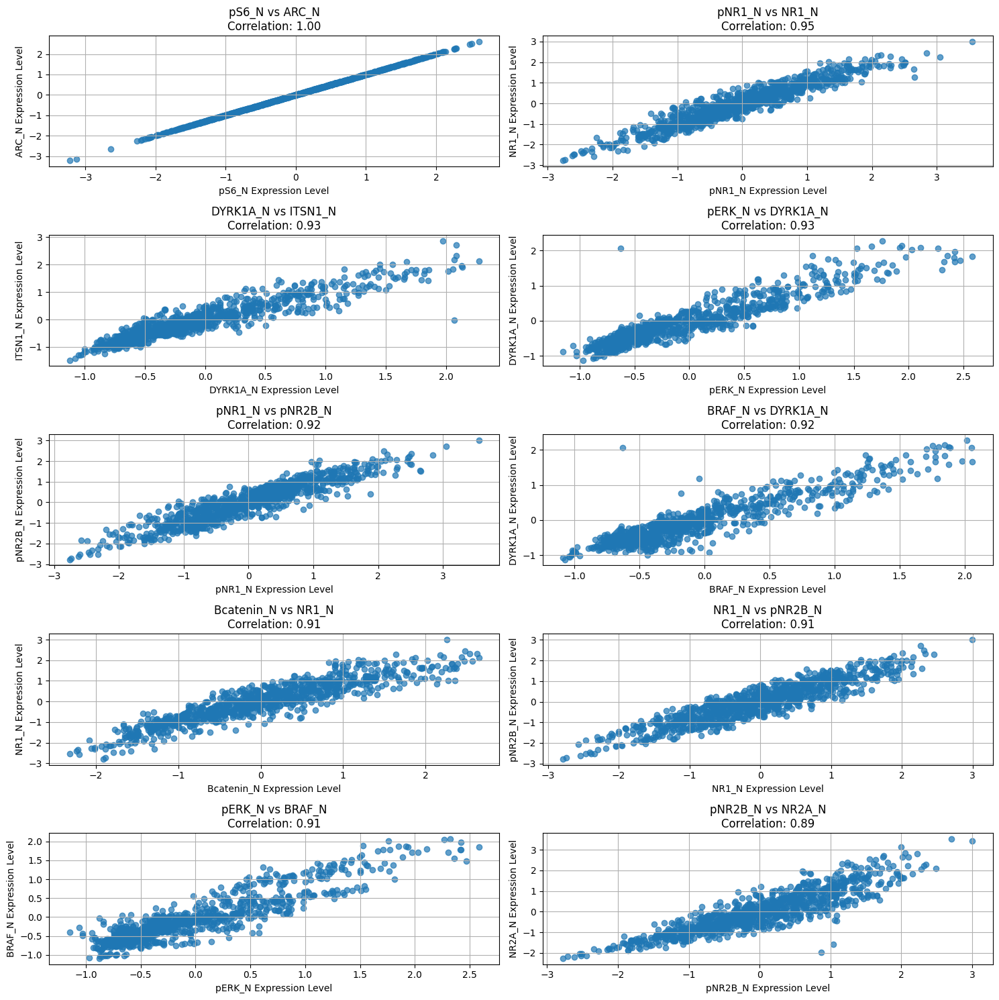

In [23]:
plt.figure(figsize=(15, 15))

for i, (row) in enumerate(top_10_pairs.itertuples(index=False), 1):
    protein1 = row[0]  # Protein A
    protein2 = row[1]  # Protein B
    correlation = row[2]  # Correlation value

    plt.subplot(5, 2, i)  # 5 rows, 2 columns, position i
    plt.scatter(data[protein1], data[protein2], alpha=0.7)
    plt.title(f'{protein1} vs {protein2}\nCorrelation: {correlation:.2f}')
    plt.xlabel(f'{protein1} Expression Level')
    plt.ylabel(f'{protein2} Expression Level')
    plt.grid(True)

plt.tight_layout()
plt.show()

In [24]:
#For feature selection first ill reduce features with correlation above 0.8 and see how that affects a simple models performance and then see if i need to reduce more
pd.set_option('display.max_rows',None)
print(unique_pairs_with_values)

      Protein A     Protein B  Correlation
67        pS6_N         ARC_N     1.000000
15       pNR1_N         NR1_N     0.947517
22     DYRK1A_N       ITSN1_N     0.932416
69       pERK_N      DYRK1A_N     0.932089
116      pNR1_N       pNR2B_N     0.923963
126      BRAF_N      DYRK1A_N     0.918439
74   Bcatenin_N         NR1_N     0.914470
40        NR1_N       pNR2B_N     0.914090
19       pERK_N        BRAF_N     0.911270
101     pNR2B_N        NR2A_N     0.887918
49       pAKT_N        pMEK_N     0.886427
52      ITSN1_N        pERK_N     0.874041
111      NR2A_N        pNR1_N     0.873348
65        NR1_N        NR2A_N     0.873165
76       pNR1_N    Bcatenin_N     0.871189
102       NR1_N        TRKA_N     0.869535
31       MTOR_N        NR2B_N     0.859279
43   Bcatenin_N       pNR2B_N     0.857125
38   Bcatenin_N        NR2A_N     0.856721
64      TIAM1_N       AMPKA_N     0.855188
118     ITSN1_N        BRAF_N     0.853724
45        ERK_N         ELK_N     0.850593
89       NR

In [25]:
corr_above_8 = unique_pairs_with_values[unique_pairs_with_values['Correlation']>=0.8]
print(corr_above_8)

      Protein A   Protein B  Correlation
67        pS6_N       ARC_N     1.000000
15       pNR1_N       NR1_N     0.947517
22     DYRK1A_N     ITSN1_N     0.932416
69       pERK_N    DYRK1A_N     0.932089
116      pNR1_N     pNR2B_N     0.923963
126      BRAF_N    DYRK1A_N     0.918439
74   Bcatenin_N       NR1_N     0.914470
40        NR1_N     pNR2B_N     0.914090
19       pERK_N      BRAF_N     0.911270
101     pNR2B_N      NR2A_N     0.887918
49       pAKT_N      pMEK_N     0.886427
52      ITSN1_N      pERK_N     0.874041
111      NR2A_N      pNR1_N     0.873348
65        NR1_N      NR2A_N     0.873165
76       pNR1_N  Bcatenin_N     0.871189
102       NR1_N      TRKA_N     0.869535
31       MTOR_N      NR2B_N     0.859279
43   Bcatenin_N     pNR2B_N     0.857125
38   Bcatenin_N      NR2A_N     0.856721
64      TIAM1_N     AMPKA_N     0.855188
118     ITSN1_N      BRAF_N     0.853724
45        ERK_N       ELK_N     0.850593
89       NR2A_N       ERK_N     0.843174
98     RAPTOR_N 

In [26]:
features_to_drop = set()

for i,row in corr_above_8.iterrows():
    a = row['Protein A']
    b=row['Protein B']
    if a not in features_to_drop:
        features_to_drop.add(b)


print(features_to_drop)
print(len(features_to_drop))



{'RSK_N', 'DYRK1A_N', 'NR2A_N', 'CREB_N', 'ELK_N', 'pAKT_N', 'TRKA_N', 'ITSN1_N', 'BRAF_N', 'Bcatenin_N', 'pMEK_N', 'NR2B_N', 'AMPKA_N', 'ARC_N', 'MTOR_N', 'EGR1_N', 'PKCA_N', 'NR1_N', 'pNR2B_N', 'BAD_N', 'pNR1_N', 'JNK_N', 'DSCR1_N', 'TIAM1_N'}
24


In [27]:
#dropping features based on correlation
features_to_drop= list(features_to_drop)
reduced_data = data.copy()
reduced_data = reduced_data.drop(columns=features_to_drop)
reduced_data =reduced_data.drop(columns='MouseID')
reduced_data.shape

(965, 58)

In [28]:
reduced_data.to_csv("Training data.csv")

In [29]:
#Importing necessary modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy import stats

In [30]:

data = pd.read_csv('/content/Data_Cortex_Nuclear.csv')


In [31]:
#Checking the structure and data types in the dataset.

print("Shape of dataset:\n",data.shape)
print('\n')
print("Datatypes:\n",data.dtypes)
print('\n')


Shape of dataset:
 (1080, 82)


Datatypes:
 MouseID             object
DYRK1A_N           float64
ITSN1_N            float64
BDNF_N             float64
NR1_N              float64
NR2A_N             float64
pAKT_N             float64
pBRAF_N            float64
pCAMKII_N          float64
pCREB_N            float64
pELK_N             float64
pERK_N             float64
pJNK_N             float64
PKCA_N             float64
pMEK_N             float64
pNR1_N             float64
pNR2A_N            float64
pNR2B_N            float64
pPKCAB_N           float64
pRSK_N             float64
AKT_N              float64
BRAF_N             float64
CAMKII_N           float64
CREB_N             float64
ELK_N              float64
ERK_N              float64
GSK3B_N            float64
JNK_N              float64
MEK_N              float64
TRKA_N             float64
RSK_N              float64
APP_N              float64
Bcatenin_N         float64
SOD1_N             float64
MTOR_N             float64
P38_N      

In [32]:
#Checking the first and last 3 rows
print(data.head(3))
print('\n')
print(data.tail(3))

  MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
0   309_1  0.503644  0.747193  0.430175  2.816329  5.990152  0.218830   
1   309_2  0.514617  0.689064  0.411770  2.789514  5.685038  0.211636   
2   309_3  0.509183  0.730247  0.418309  2.687201  5.622059  0.209011   

    pBRAF_N  pCAMKII_N   pCREB_N  ...   pCFOS_N     SYP_N  H3AcK18_N  \
0  0.177565   2.373744  0.232224  ...  0.108336  0.427099   0.114783   
1  0.172817   2.292150  0.226972  ...  0.104315  0.441581   0.111974   
2  0.175722   2.283337  0.230247  ...  0.106219  0.435777   0.111883   

     EGR1_N  H3MeK4_N    CaNA_N  Genotype  Treatment  Behavior   class  
0  0.131790  0.128186  1.675652   Control  Memantine       C/S  c-CS-m  
1  0.135103  0.131119  1.743610   Control  Memantine       C/S  c-CS-m  
2  0.133362  0.127431  1.926427   Control  Memantine       C/S  c-CS-m  

[3 rows x 82 columns]


       MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N    pAKT_N  \
1077  J3295_13  0.22870

MouseID              0
DYRK1A_N             3
ITSN1_N              3
BDNF_N               3
NR1_N                3
NR2A_N               3
pAKT_N               3
pBRAF_N              3
pCAMKII_N            3
pCREB_N              3
pELK_N               3
pERK_N               3
pJNK_N               3
PKCA_N               3
pMEK_N               3
pNR1_N               3
pNR2A_N              3
pNR2B_N              3
pPKCAB_N             3
pRSK_N               3
AKT_N                3
BRAF_N               3
CAMKII_N             3
CREB_N               3
ELK_N               18
ERK_N                3
GSK3B_N              3
JNK_N                3
MEK_N                7
TRKA_N               3
RSK_N                3
APP_N                3
Bcatenin_N          18
SOD1_N               3
MTOR_N               3
P38_N                3
pMTOR_N              3
DSCR1_N              3
AMPKA_N              3
NR2B_N               3
pNUMB_N              3
RAPTOR_N             3
TIAM1_N              3
pP70S6_N   

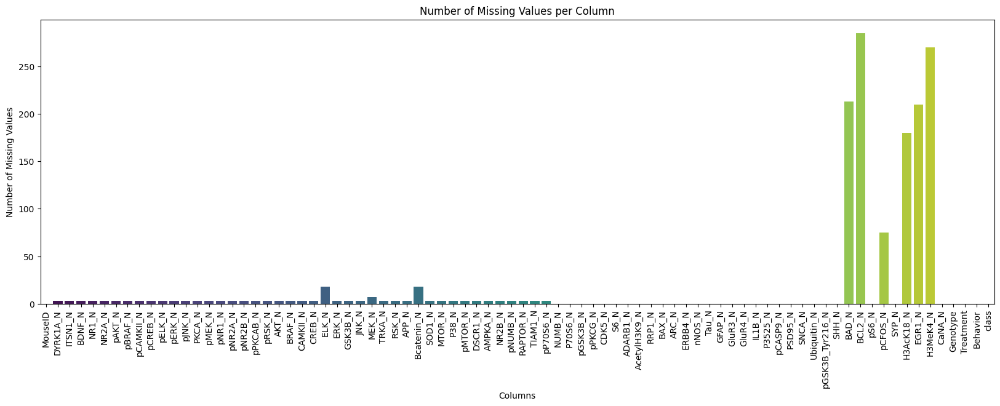

In [33]:
#Checking and handling missing data
#Since theres 82 columns viewing the missing data in numbers is  tedious so visualizing it
missing_data = data.isna().sum()
print(missing_data)

plt.figure(figsize=(20, 6))
sns.barplot(x=missing_data.index, y=missing_data.values,hue=missing_data.index, palette='viridis')
plt.title('Number of Missing Values per Column')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.xticks(rotation=90)
plt.show()

In [34]:
#using knn to fill missing data since ive never tried that
#A key  thing  to note is that all missing  values are protein expression level values  so to fill the missing data ill separate them for now
#first ensuring all protein expression  levels are numeric
print(data.columns)
protein_data = data.iloc[:, 1:78].astype(float)

#First Scaling the data  to ensure value  ranges are uniform then using knn impute to fill missing data
scaler = StandardScaler()
protein_data_scaled = scaler.fit_transform(protein_data)
imputer = KNNImputer(n_neighbors=5)
protein_data_imputed = imputer.fit_transform(protein_data_scaled)
protein_data_imputed = pd.DataFrame(protein_data_imputed, columns=protein_data.columns)
print(protein_data_imputed)
data.iloc[:, 1:78] = protein_data_imputed

Index(['MouseID', 'DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N',
       'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N',
       'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N',
       'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N',
       'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N',
       'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N',
       'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N',
       'pGSK3B_N', 'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N',
       'RRP1_N', 'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N',
       'GluR3_N', 'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N',
       'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N',
       'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N',
       'CaNA_N', 'Genotype', 'Treatment', 'Behavior', 'class'],
      dtype='object')
      DYRK

MouseID            0
DYRK1A_N           0
ITSN1_N            0
BDNF_N             0
NR1_N              0
NR2A_N             0
pAKT_N             0
pBRAF_N            0
pCAMKII_N          0
pCREB_N            0
pELK_N             0
pERK_N             0
pJNK_N             0
PKCA_N             0
pMEK_N             0
pNR1_N             0
pNR2A_N            0
pNR2B_N            0
pPKCAB_N           0
pRSK_N             0
AKT_N              0
BRAF_N             0
CAMKII_N           0
CREB_N             0
ELK_N              0
ERK_N              0
GSK3B_N            0
JNK_N              0
MEK_N              0
TRKA_N             0
RSK_N              0
APP_N              0
Bcatenin_N         0
SOD1_N             0
MTOR_N             0
P38_N              0
pMTOR_N            0
DSCR1_N            0
AMPKA_N            0
NR2B_N             0
pNUMB_N            0
RAPTOR_N           0
TIAM1_N            0
pP70S6_N           0
NUMB_N             0
P70S6_N            0
pGSK3B_N           0
pPKCG_N      

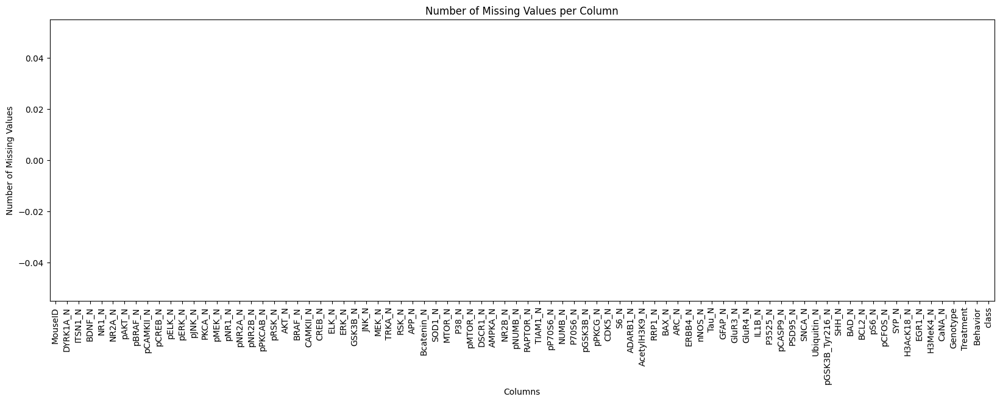

In [35]:
#Now checking missing data
missing_data = data.isna().sum()
print(missing_data)

plt.figure(figsize=(20, 6))
sns.barplot(x=missing_data.index, y=missing_data.values, hue=missing_data.index,palette='viridis')
plt.title('Number of Missing Values per Column')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.xticks(rotation=90)
plt.show()

In [36]:
#removing outliers

# Calculate Z-scores for the data
z_scores = stats.zscore(data.iloc[:, 1:78].astype(float))

# Convert Z-scores to a DataFrame
z_scores_df = pd.DataFrame(z_scores, columns=data.columns[1:78])
threshold = 4
outliers = (abs(z_scores_df) > threshold)

# Remove outliers
data_no_outliers_zscore = data[~outliers.any(axis=1)]
print(f"Removed {len(data) - len(data_no_outliers_zscore)} outliers using Z-score method.")
data = data_no_outliers_zscore

Removed 115 outliers using Z-score method.


In [37]:
print(data.head(1))
print("\n")
print(data.shape)


  MouseID  DYRK1A_N   ITSN1_N    BDNF_N     NR1_N    NR2A_N   pAKT_N  \
0   309_1  0.312276  0.517214  2.250537  1.495281  2.301162 -0.34454   

    pBRAF_N  pCAMKII_N   pCREB_N  ...  pCFOS_N     SYP_N  H3AcK18_N    EGR1_N  \
0 -0.158381  -0.898651  0.603275  ... -0.95247 -0.285744  -0.923474 -1.271459   

   H3MeK4_N    CaNA_N  Genotype  Treatment  Behavior   class  
0 -1.392474  1.065901   Control  Memantine       C/S  c-CS-m  

[1 rows x 82 columns]


(965, 82)


In [38]:
#Now checking the categories and their value counts
print("Genotypes: ",data['Genotype'].value_counts())
print("\n")
print("Treatment: ",data['Treatment'].value_counts())
print("\n")
print("Behavior: ",data['Behavior'].value_counts())
print("\n")
print("class: ",data['class'].value_counts())

Genotypes:  Genotype
Control    501
Ts65Dn     464
Name: count, dtype: int64


Treatment:  Treatment
Memantine    521
Saline       444
Name: count, dtype: int64


Behavior:  Behavior
S/C    495
C/S    470
Name: count, dtype: int64


class:  class
c-CS-m    146
c-SC-m    136
t-SC-s    132
t-CS-m    128
c-SC-s    116
t-SC-m    111
c-CS-s    103
t-CS-s     93
Name: count, dtype: int64


In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
from random import randint
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
import numpy as np
from imblearn.metrics import classification_report_imbalanced
from collections import Counter

In [40]:
df = pd.read_csv("Training data.csv")
df

,Unnamed: 0,BDNF_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,pNR2A_N,pPKCAB_N,...,pCFOS_N,SYP_N,H3AcK18_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class,class_encoded
0,0,2.250537,-0.158381,-0.898651,0.603275,0.690514,0.411423,-0.137116,-0.645256,1.626825,...,-0.952470,-0.285744,-0.923474,-1.392474,1.065901,Control,Memantine,C/S,c-CS-m,0
1,1,1.877666,-0.334058,-0.961679,0.442043,0.359331,0.431994,-0.278214,-0.741644,1.075054,...,-1.121037,-0.067645,-0.970800,-1.339606,1.280291,Control,Memantine,C/S,c-CS-m,0
2,2,2.010130,-0.226576,-0.968487,0.542580,0.284204,0.380834,-0.427866,-0.662410,1.023029,...,-1.041213,-0.155059,-0.972326,-1.406074,1.857038,Control,Memantine,C/S,c-CS-m,0
3,3,0.801008,-0.199184,-1.069707,-0.170998,0.356565,0.108280,-0.322916,-1.099581,1.261361,...,-0.829787,-0.818989,-0.660340,-1.055134,1.144490,Control,Memantine,C/S,c-CS-m,0
4,4,0.804572,-0.304093,-1.083833,-0.626799,0.161882,0.014649,-0.510918,-1.165050,1.014127,...,-0.853604,-0.179502,-0.861182,-1.028479,1.583530,Control,Memantine,C/S,c-CS-m,0
5,5,0.978515,-0.207665,-1.078218,-0.533786,0.029391,0.059208,-0.455817,-1.094188,0.919804,...,-0.905938,-0.093972,-0.891908,-1.140223,1.509893,Control,Memantine,C/S,c-CS-m,0
6,6,0.478536,0.079814,-1.177764,-0.515325,0.392886,-0.104316,-0.266604,-1.285328,1.011788,...,-0.820501,-0.599078,-0.545399,-0.864111,0.601617,Control,Memantine,C/S,c-CS-m,0
7,7,0.174520,-0.080584,-1.181185,-0.699084,-0.008745,-0.129884,-0.586855,-1.321966,0.688799,...,-0.753555,-0.956928,-0.778747,-0.829679,0.993360,Control,Memantine,C/S,c-CS-m,0
8,8,-0.027714,-0.520469,-1.294328,-0.979049,-0.357394,-0.200641,-0.895775,-1.425941,0.616196,...,-1.071776,-0.156410,-0.748477,-0.850836,1.567344,Control,Memantine,C/S,c-CS-m,0
9,9,0.878720,0.231095,-1.405294,-0.751602,-0.030755,-0.261929,0.204251,-1.504503,0.535579,...,-0.593128,-0.471072,-0.395425,-0.236230,0.564951,Control,Memantine,C/S,c-CS-m,0


In [41]:
X = df.iloc[:,1:54]
X

,BDNF_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pERK_N,pJNK_N,pNR2A_N,pPKCAB_N,pRSK_N,...,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,H3MeK4_N,CaNA_N
0,2.250537,-0.158381,-0.898651,0.603275,0.690514,0.411423,-0.137116,-0.645256,1.626825,-0.018732,...,-1.119835,-0.182566,-1.305403,-1.239745,-1.066276,-0.952470,-0.285744,-0.923474,-1.392474,1.065901
1,1.877666,-0.334058,-0.961679,0.442043,0.359331,0.431994,-0.278214,-0.741644,1.075054,0.035626,...,-1.322118,0.005344,-0.906725,-1.205621,-1.046167,-1.121037,-0.067645,-0.970800,-1.339606,1.280291
2,2.010130,-0.226576,-0.968487,0.542580,0.284204,0.380834,-0.427866,-0.662410,1.023029,0.372445,...,-1.397250,-0.021831,-1.138611,-1.205621,-0.926271,-1.041213,-0.155059,-0.972326,-1.406074,1.857038
3,0.801008,-0.199184,-1.069707,-0.170998,0.356565,0.108280,-0.322916,-1.099581,1.261361,0.522544,...,-1.435423,-0.164318,-1.192887,-0.867816,-1.285019,-0.829787,-0.818989,-0.660340,-1.055134,1.144490
4,0.804572,-0.304093,-1.083833,-0.626799,0.161882,0.014649,-0.510918,-1.165050,1.014127,0.608759,...,-1.391905,0.317194,-0.727242,-0.835413,-1.172895,-0.853604,-0.179502,-0.861182,-1.028479,1.583530
5,0.978515,-0.207665,-1.078218,-0.533786,0.029391,0.059208,-0.455817,-1.094188,0.919804,0.796088,...,-1.839150,-0.053967,-1.249570,-0.835413,-1.054290,-0.905938,-0.093972,-0.891908,-1.140223,1.509893
6,0.478536,0.079814,-1.177764,-0.515325,0.392886,-0.104316,-0.266604,-1.285328,1.011788,0.819885,...,-1.213260,-0.535528,-1.555321,-0.262100,-1.659913,-0.820501,-0.599078,-0.545399,-0.864111,0.601617
7,0.174520,-0.080584,-1.181185,-0.699084,-0.008745,-0.129884,-0.586855,-1.321966,0.688799,0.700918,...,-1.704474,-0.050923,-1.211893,-0.288003,-1.543613,-0.753555,-0.956928,-0.778747,-0.829679,0.993360
8,-0.027714,-0.520469,-1.294328,-0.979049,-0.357394,-0.200641,-0.895775,-1.425941,0.616196,0.324491,...,-1.685078,-0.175928,-1.390782,-0.466487,-1.147578,-1.071776,-0.156410,-0.748477,-0.850836,1.567344
9,0.878720,0.231095,-1.405294,-0.751602,-0.030755,-0.261929,0.204251,-1.504503,0.535579,0.753132,...,-1.550126,-0.481308,-1.282221,0.026325,-1.977626,-0.593128,-0.471072,-0.395425,-0.236230,0.564951


In [42]:
y = df['class_encoded']
y

0      0
1      0
2      0
3      0
4      0
5      0
6      0
7      0
8      0
9      0
10     0
11     0
12     0
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22     0
23     0
24     0
25     0
26     0
27     0
28     0
29     0
30     0
31     0
32     0
33     0
34     0
35     0
36     0
37     0
38     0
39     0
40     0
41     0
42     0
43     0
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     0
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
110    0
1

In [43]:
# Split the data into training and test sets
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3, random_state=42)

In [44]:
# Determine the majority class size
max_size = max(Counter(y_train).values())
print(f"Size of the largest class in the original training set: {max_size}")

# Initialize SMOTE to balance all classes to the maximum size
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Apply SMOTE to the training data
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check class distribution after SMOTE
print("Class distribution in the resampled training set:")
print(pd.Series(y_train_resampled).value_counts())

# Initialize Random Forest model
random_forest_model = RandomForestClassifier(random_state=42)

# Create a pipeline with SMOTE and Random Forest
pipeline = Pipeline([
    ('smote', smote),
    ('rf', random_forest_model)
])

# Define parameter grid for Random Forest hyperparameter tuning
param_dist_rf = {
    'rf__n_estimators': [50, 100, 150, 200],
    'rf__max_depth': [None, 10, 20, 30],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4]
}

# Initialize RandomizedSearchCV for hyperparameter tuning
random_search_rf = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_dist_rf,
    n_iter=50,  # Number of parameter settings to sample
    cv=3,  # 3-fold cross-validation
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# Fit RandomizedSearchCV to the resampled training data
random_search_rf.fit(X_train_resampled, y_train_resampled)

# Get the best model from RandomizedSearchCV
best_rf_model = random_search_rf.best_estimator_

# Make predictions on the test set using the best model
y_pred_rf = best_rf_model.predict(X_test)

# Evaluate the tuned Random Forest model
accuracy = accuracy_score(y_test, y_pred_rf)
classification_report_rf = classification_report(y_test, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

print(f"Random Forest Best Parameters: {random_search_rf.best_params_}")
print(f"Random Forest Accuracy: {accuracy:.2f}")
print(f"Random Forest Classification Report:\n{classification_report_rf}")
print(f"Random Forest Confusion Matrix:\n{conf_matrix_rf}")

Size of the largest class in the original training set: 103
Class distribution in the resampled training set:
class_encoded
5    103
6    103
2    103
1    103
0    103
7    103
4    103
3    103
Name: count, dtype: int64
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Random Forest Best Parameters: {'rf__n_estimators': 150, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_depth': 30}
Random Forest Accuracy: 0.98
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.97        43
           1       0.97      1.00      0.99        39
           2       1.00      1.00      1.00        35
           3       0.97      1.00      0.98        31
           4       0.98      1.00      0.99        43
           5       1.00      0.88      0.94        25
           6       1.00      0.96      0.98        27
           7       1.00      1.00      1.00        47

    accuracy                 

In [45]:
# Determine the majority class size
max_size = max(Counter(y_train).values())
print(f"Size of the largest class in the original training set: {max_size}")

# Initialize SMOTE to balance all classes to the maximum size
smote = SMOTE(sampling_strategy='auto', random_state=42)

X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# XGBoost Hyperparameter Tuning
param_dist_xgb = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}
random_search_xgb = RandomizedSearchCV(
    estimator=xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
    param_distributions=param_dist_xgb,
    n_iter=20,
    cv=2,
    n_jobs=-1,
    verbose=2,
    random_state=42
)
random_search_xgb.fit(X_train_resampled, y_train_resampled)

best_xgb_model = random_search_xgb.best_estimator_

# Evaluate tuned XGBoost model
y_pred_xgb = best_xgb_model.predict(X_test)
print(f"XGBoost Best Parameters: {random_search_xgb.best_params_}")
print(f"XGBoost Accuracy: {accuracy_score(y_test, y_pred_xgb):.2f}")
print(f"XGBoost Classification Report:\n{classification_report(y_test, y_pred_xgb)}")
print(f"XGBoost Confusion Matrix:\n{confusion_matrix(y_test, y_pred_xgb)}")

Size of the largest class in the original training set: 103
Fitting 2 folds for each of 20 candidates, totalling 40 fits
XGBoost Best Parameters: {'subsample': 0.6, 'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
XGBoost Accuracy: 0.97
XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.98      0.95        43
           1       0.97      0.90      0.93        39
           2       1.00      1.00      1.00        35
           3       0.97      1.00      0.98        31
           4       1.00      0.93      0.96        43
           5       0.86      1.00      0.93        25
           6       1.00      0.96      0.98        27
           7       1.00      1.00      1.00        47

    accuracy                           0.97       290
   macro avg       0.97      0.97      0.97       290
weighted avg       0.97      0.97      0.97       290

XGBoost Confusion Matrix:
[[42  1  0  0  0  0 

In [46]:
# Determine the majority class size
max_size = max(Counter(y_train).values())
print(f"Size of the largest class in the original training set: {max_size}")

# Initialize SMOTE to balance all classes to the maximum size
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Apply SMOTE to the training data
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

svm_clf = SVC(kernel='linear', random_state=42)

# Train the model
svm_clf.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred = svm_clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix_svm = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:}")
print("\nClassification Report:")
print(report)
print(f"Confusion Matrix:\n{conf_matrix_svm}")

Size of the largest class in the original training set: 103
Accuracy: 0.996551724137931

Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        43
           1       1.00      0.97      0.99        39
           2       1.00      1.00      1.00        35
           3       1.00      1.00      1.00        31
           4       1.00      1.00      1.00        43
           5       1.00      1.00      1.00        25
           6       1.00      1.00      1.00        27
           7       1.00      1.00      1.00        47

    accuracy                           1.00       290
   macro avg       1.00      1.00      1.00       290
weighted avg       1.00      1.00      1.00       290

Confusion Matrix:
[[43  0  0  0  0  0  0  0]
 [ 1 38  0  0  0  0  0  0]
 [ 0  0 35  0  0  0  0  0]
 [ 0  0  0 31  0  0  0  0]
 [ 0  0  0  0 43  0  0  0]
 [ 0  0  0  0  0 25  0  0]
 [ 0  0  0  0  0  0 27  0]
 [ 0  0  0  0  0  0  0 47]]


In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from imblearn.metrics import classification_report_imbalanced
from sklearn.svm import SVC




In [48]:
# Load data
df = pd.read_csv("Training data.csv")





In [49]:
# Define features and target
X = df.iloc[:, 1:54]
y = df['class_encoded']

In [50]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



In [51]:
# Initialize SMOTE to handle class imbalance
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Apply SMOTE to the training data
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)



Fitting 3 folds for each of 50 candidates, totalling 150 fits
Random Forest Evaluation:
Best Parameters: {'rf__n_estimators': 150, 'rf__min_samples_split': 2, 'rf__min_samples_leaf': 1, 'rf__max_depth': 30}
Accuracy: 0.98
Classification Report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.95      0.98      0.99      0.97      0.98      0.97        43
          1       0.97      1.00      1.00      0.99      1.00      1.00        39
          2       1.00      1.00      1.00      1.00      1.00      1.00        35
          3       0.97      1.00      1.00      0.98      1.00      1.00        31
          4       0.98      1.00      1.00      0.99      1.00      1.00        43
          5       1.00      0.88      1.00      0.94      0.94      0.87        25
          6       1.00      0.96      1.00      0.98      0.98      0.96        27
          7       1.00      1.00      1.00      1.00      1.00      1.00        47

avg / 

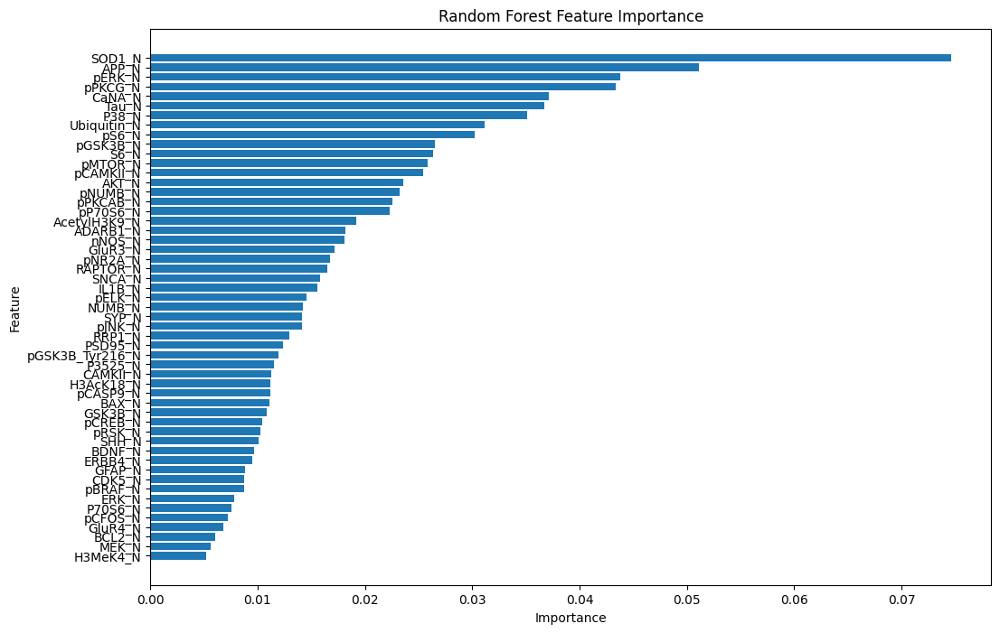

Top 10 important features for Random Forest:
        Feature  Importance
16       SOD1_N    0.074625
15        APP_N    0.051145
5        pERK_N    0.043823
25      pPKCG_N    0.043394
52       CaNA_N    0.037129
34        Tau_N    0.036696
17        P38_N    0.035072
43  Ubiquitin_N    0.031137
47        pS6_N    0.030194
24     pGSK3B_N    0.026481


In [52]:
# Random Forest Model
random_forest_model = RandomForestClassifier(random_state=42)

# Create a pipeline with SMOTE and Random Forest
pipeline = Pipeline([
    ('smote', smote),
    ('rf', random_forest_model)
])

# Define parameter grid for Random Forest hyperparameter tuning
param_dist_rf = {
    'rf__n_estimators': [50, 100, 150, 200],
    'rf__max_depth': [None, 10, 20, 30],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4]
}

# Initialize RandomizedSearchCV for hyperparameter tuning
random_search_rf = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_dist_rf,
    n_iter=50,  # Number of parameter settings to sample
    cv=3,  # 3-fold cross-validation
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# Fit RandomizedSearchCV to the resampled training data
random_search_rf.fit(X_train_resampled, y_train_resampled)

# Get the best model from RandomizedSearchCV
best_rf_model = random_search_rf.best_estimator_

# Make predictions on the test set using the best model
y_pred_rf = best_rf_model.predict(X_test)

# Evaluate the tuned Random Forest model
print("Random Forest Evaluation:")
print(f"Best Parameters: {random_search_rf.best_params_}")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf):.2f}")
print(f"Classification Report:\n{classification_report_imbalanced(y_test, y_pred_rf)}")
print(f"Confusion Matrix:\n{confusion_matrix(y_test, y_pred_rf)}")

# Get feature importances from the best Random Forest model
importances_rf = best_rf_model.named_steps['rf'].feature_importances_

# Create a DataFrame for easy visualization
feature_importances_rf = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances_rf
})

# Sort features by importance
feature_importances_rf = feature_importances_rf.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importances_rf['Feature'], feature_importances_rf['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importance')
plt.gca().invert_yaxis()
plt.show()

print("Top 10 important features for Random Forest:")
print(feature_importances_rf.head(10))



Fitting 2 folds for each of 20 candidates, totalling 40 fits
XGBoost Evaluation:
Best Parameters: {'subsample': 0.6, 'n_estimators': 150, 'max_depth': 3, 'learning_rate': 0.2, 'colsample_bytree': 0.6}
Accuracy: 0.97
Classification Report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.93      0.98      0.99      0.95      0.98      0.96        43
          1       0.97      0.90      1.00      0.93      0.95      0.89        39
          2       1.00      1.00      1.00      1.00      1.00      1.00        35
          3       0.97      1.00      1.00      0.98      1.00      1.00        31
          4       1.00      0.93      1.00      0.96      0.96      0.92        43
          5       0.86      1.00      0.98      0.93      0.99      0.99        25
          6       1.00      0.96      1.00      0.98      0.98      0.96        27
          7       1.00      1.00      1.00      1.00      1.00      1.00        47

avg / total 

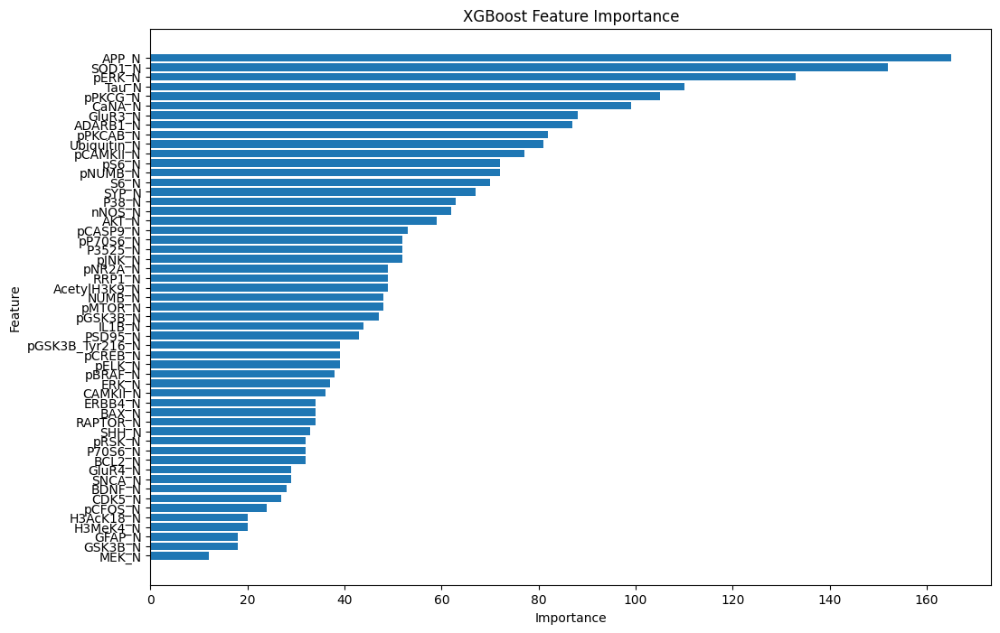

Top 10 important features for XGBoost:
        Feature  Importance
15        APP_N       165.0
16       SOD1_N       152.0
5        pERK_N       133.0
34        Tau_N       110.0
25      pPKCG_N       105.0
52       CaNA_N        99.0
36      GluR3_N        88.0
28     ADARB1_N        87.0
8      pPKCAB_N        82.0
43  Ubiquitin_N        81.0


In [53]:
# XGBoost Model
param_dist_xgb = {
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}
random_search_xgb = RandomizedSearchCV(
    estimator=xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42),
    param_distributions=param_dist_xgb,
    n_iter=20,
    cv=2,
    n_jobs=-1,
    verbose=2,
    random_state=42
)
random_search_xgb.fit(X_train_resampled, y_train_resampled)

best_xgb_model = random_search_xgb.best_estimator_

# Make predictions on the test set
y_pred_xgb = best_xgb_model.predict(X_test)

# Evaluate the tuned XGBoost model
print("XGBoost Evaluation:")
print(f"Best Parameters: {random_search_xgb.best_params_}")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.2f}")
print(f"Classification Report:\n{classification_report_imbalanced(y_test, y_pred_xgb)}")
print(f"Confusion Matrix:\n{confusion_matrix(y_test, y_pred_xgb)}")

# Get feature importances from the best XGBoost model
importances_xgb = best_xgb_model.get_booster().get_score(importance_type='weight')

# Create a DataFrame for easy visualization
feature_importances_xgb = pd.DataFrame({
    'Feature': importances_xgb.keys(),
    'Importance': importances_xgb.values()
})

# Sort features by importance
feature_importances_xgb = feature_importances_xgb.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importances_xgb['Feature'], feature_importances_xgb['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('XGBoost Feature Importance')
plt.gca().invert_yaxis()
plt.show()

print("Top 10 important features for XGBoost:")
print(feature_importances_xgb.head(10))



SVM Evaluation:
Accuracy: 1.00
Classification Report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      1.00      1.00      0.99      1.00      1.00        43
          1       1.00      0.97      1.00      0.99      0.99      0.97        39
          2       1.00      1.00      1.00      1.00      1.00      1.00        35
          3       1.00      1.00      1.00      1.00      1.00      1.00        31
          4       1.00      1.00      1.00      1.00      1.00      1.00        43
          5       1.00      1.00      1.00      1.00      1.00      1.00        25
          6       1.00      1.00      1.00      1.00      1.00      1.00        27
          7       1.00      1.00      1.00      1.00      1.00      1.00        47

avg / total       1.00      1.00      1.00      1.00      1.00      1.00       290

Confusion Matrix:
[[43  0  0  0  0  0  0  0]
 [ 1 38  0  0  0  0  0  0]
 [ 0  0 35  0  0  0  0  0]
 [ 0  0  0 31 

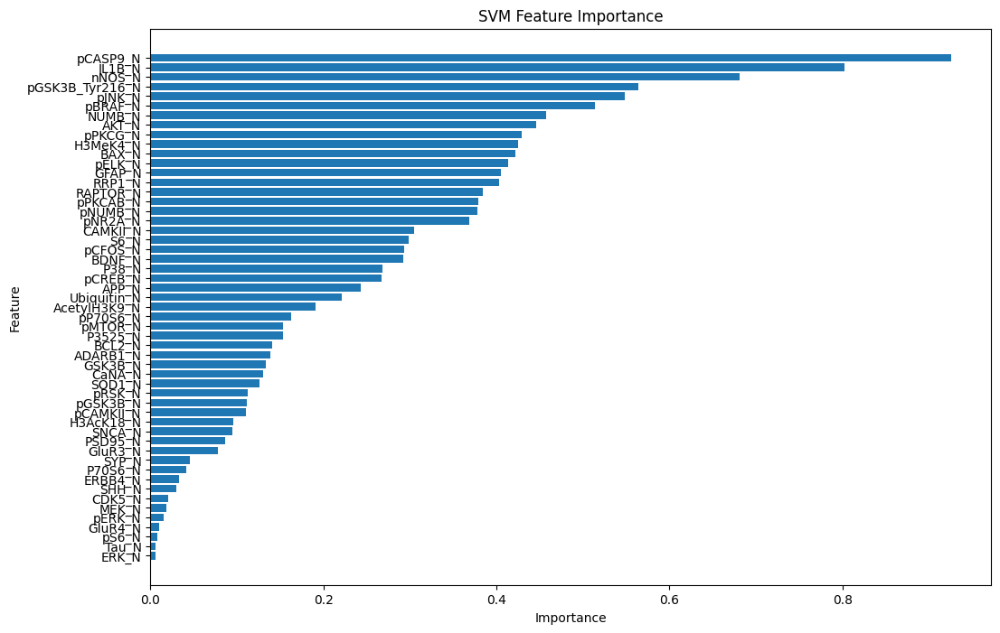

Top 10 important features for SVM:
            Feature  Coefficient  Importance
40         pCASP9_N    -0.925725    0.925725
38           IL1B_N     0.802352    0.802352
33           nNOS_N     0.681171    0.681171
44  pGSK3B_Tyr216_N     0.563948    0.563948
6            pJNK_N     0.548311    0.548311
1           pBRAF_N     0.513415    0.513415
22           NUMB_N    -0.457674    0.457674
10            AKT_N     0.445963    0.445963
25          pPKCG_N    -0.429625    0.429625
51         H3MeK4_N    -0.425551    0.425551


In [54]:
# SVM Model
svm_clf = SVC(kernel='linear', random_state=42)

# Train the SVM model
svm_clf.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred_svm = svm_clf.predict(X_test)

# Evaluate the SVM model
print("SVM Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_svm):.2f}")
print(f"Classification Report:\n{classification_report_imbalanced(y_test, y_pred_svm)}")
print(f"Confusion Matrix:\n{confusion_matrix(y_test, y_pred_svm)}")

# Get feature coefficients from the SVM model
coefficients_svm = svm_clf.coef_[0]

# Create a DataFrame for easy visualization
feature_importances_svm = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': coefficients_svm
})

# Take the absolute value of coefficients to determine importance
feature_importances_svm['Importance'] = feature_importances_svm['Coefficient'].abs()

# Sort features by importance
feature_importances_svm = feature_importances_svm.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(feature_importances_svm['Feature'], feature_importances_svm['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('SVM Feature Importance')
plt.gca().invert_yaxis()
plt.show()

print("Top 10 important features for SVM:")
print(feature_importances_svm.head(10))